In [1]:
import os
os.chdir("E:\\Projects\\diffusion")
import scanpy as sc
import matplotlib.pyplot as plt
import torch
import seaborn as sns
import warnings
from tqdm.auto import tqdm
from STAGATE_pyG.utils import Transfer_pytorch_Data
from diffusers.utils import randn_tensor
from stadiff.models import SpaUNet1DModel
from stadiff.pipeline import prepare_dataset
import torch.nn.functional as F
from diffusers import DDPMScheduler
from collections import defaultdict
from torch_geometric.loader import NeighborLoader
from diffusers.models.unet_1d import UNet1DModel
from diffusers.models.unet_2d import UNet2DModel
os.environ["R_HOME"] = r"D:\Program Files\R\R-4.0.3"

warnings.filterwarnings("ignore")
sns.set_theme("paper", style="ticks", font_scale=1.25)

def evaluate(adata, data, niose_scheduler, model, save_folder=None,
             prefix=None,
             cluster_method="mclust",
             cluster_params=7):
    denoised = randn_tensor(data.x.shape, device=data.x.device)
    denoised = denoised.unsqueeze(1)
    with torch.no_grad():
        for t in niose_scheduler.timesteps:
            if isinstance(model, UNet1DModel):
                model_output = model(denoised, t).sample
            elif isinstance(model, SpaUNet1DModel):
                model_output = model(denoised, t, data.spatial).sample
            else:
                raise NotImplementedError
            denoised = niose_scheduler.step(model_output, t, denoised).prev_sample
    denoised = denoised.squeeze(1)
    adata.obsm["STAGATE_denoised"] = denoised.cpu().numpy()
    sc.pp.neighbors(adata, use_rep="STAGATE_denoised", n_neighbors=30)
    sc.tl.umap(adata, min_dist=0.5)
    # perform leiden clustering
    if cluster_method == "leiden":
        sc.tl.leiden(adata, key_added="leiden", resolution=cluster_params)
    elif cluster_method == "mclust":
        adata = utils.mclust_R(adata, cluster_params,
                               used_obsm="STAGATE_denoised", add_key="mclust", random_seed=2023)
    else:
        raise NotImplementedError
    if save_folder is not None:
        if not os.path.exists(save_folder):
            os.makedirs(save_folder)
    with plt.rc_context():
        sc.pl.umap(adata, color=[cluster_method], ncols=1, frameon=False, wspace=0.4, use_raw=False,
                   show=False)
        plt.savefig(os.path.join(save_folder, "umap-{}_{}.png".format(prefix, cluster_method)))

def num_params(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)


def train_loop(train_loader, model, n_epochs=1000, gradient_clip=5,
               save_dir=None, model_name="model.pth"):
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-6)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=n_epochs)
    loss_list = []
    pbar = tqdm(range(n_epochs))
    model.train()
    for epoch in range(1, n_epochs+1):
        for batch in train_loader:
            optimizer.zero_grad()
            z, out = model(batch.x, batch.edge_index)
            loss = F.mse_loss(out, batch.x)
            loss_list.append(loss.item())
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), gradient_clip)
            optimizer.step()
            pbar.set_description(f"Epoch: {epoch}, Loss: {loss.item():.4f}")
            loss_list.append(loss.item())
        scheduler.step()
        pbar.update(1)
    # check if save_dir is not None and exists
    if save_dir is not None:
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        torch.save(model.state_dict(), os.path.join(save_dir, model_name))
    return model, loss_list


def eval_model(model, data, adata, add_key):
    model.eval()
    with torch.no_grad():
        z, out = spa_ae(data.x, data.edge_index)
    adata.obsm[add_key] = z.detach().cpu().numpy()
    adata = utils.mclust_R(adata, 7, used_obsm=add_key, add_key=add_key + "_mclust", random_seed=2023)
    sc.pp.neighbors(adata, use_rep=add_key, n_neighbors=30)
    sc.tl.umap(adata, min_dist=0.5)
    sc.pl.umap(adata, color=[add_key + "_mclust"], ncols=1, frameon=False, wspace=0.4, use_raw=False)

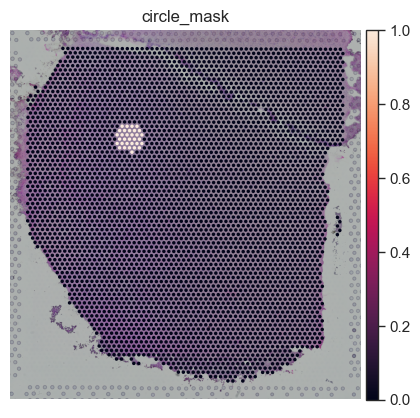

In [2]:
import stadiff.utils as utils
adata = sc.read_h5ad("E:\Projects\diffusion\dataset\STAGATE.h5ad")
# mask region
mask1 = {"type": "circle",
         "args": {"center": [5000, 5000], "radius": 400}
         }
mask2 = {"type": "rectangle",
         "args": {"left_bottom": [6500, 2500], "right_top": [7000, 5400]}}
adata_mask1 = utils.mask_region(adata, mask1["type"], add_key="circle_mask", **mask1["args"])
adata_mask1.obs["circle_mask"] = adata_mask1.obs["circle_mask"].astype("int")
sc.pl.spatial(adata_mask1, color=["circle_mask"], ncols=1, frameon=False, wspace=0.4, use_raw=False)

In [16]:
adata.obs

,in_tissue,array_row,array_col,Manual annotation,n_genes
AAACAACGAATAGTTC-1,1,0,16,Layer_1,727
AAACAAGTATCTCCCA-1,1,50,102,Layer_3,2170
AAACAATCTACTAGCA-1,1,3,43,Layer_1,1093
AAACACCAATAACTGC-1,1,59,19,WM,1896
AAACAGCTTTCAGAAG-1,1,43,9,Layer_6,1620
...,...,...,...,...,...
TTGTTGTGTGTCAAGA-1,1,31,77,Layer_3,1320
TTGTTTCACATCCAGG-1,1,58,42,Layer_6,1444
TTGTTTCATTAGTCTA-1,1,60,30,WM,629
TTGTTTCCATACAACT-1,1,45,27,Layer_6,1697


In [8]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
data = prepare_dataset(adata_mask1, used_key=None,
                       used_spatial='spatial',
                       device=device)

In [9]:
from stadiff.dataset import MaskNode
masker = MaskNode(data, adata_mask1.obs["circle_mask"].values)
data_mask1 = masker.get_data(data)
adata_mask1 = adata[~adata_mask1.obs["circle_mask"].astype(bool), :]
loader = NeighborLoader(data_mask1, num_neighbors=[5, 3],
                        batch_size=32,
                        )

Mask 32 nodes and there are 4194 spots remaining


  0%|          | 0/1000 [00:00<?, ?it/s]

fitting ...
  |======================================================================| 100%


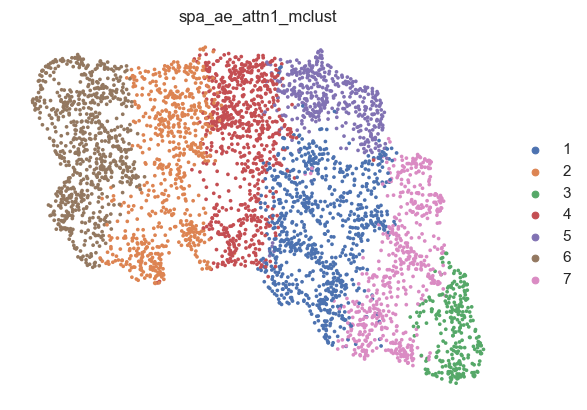

In [23]:
from stadiff.vae import SpaAE
save_dir = "E:\Projects\\diffusion\\output"
n_epochs, gradient_clip = 1000, 5
spa_ae = SpaAE(input_dim=3000,
               block_list=["AttnBlock"],
               gat_dim=[512],
               block_out_dims=[512, 32]).to(device)
spa_ae, loss_list = train_loop(loader,
                               spa_ae,
                               n_epochs=n_epochs,
                               gradient_clip=gradient_clip,
                               save_dir=os.path.join(save_dir, "spa_ae_attn1"))
eval_model(spa_ae, data_mask1, adata_mask1, "spa_ae_attn1")

  0%|          | 0/1000 [00:00<?, ?it/s]

fitting ...
  |======================================================================| 100%


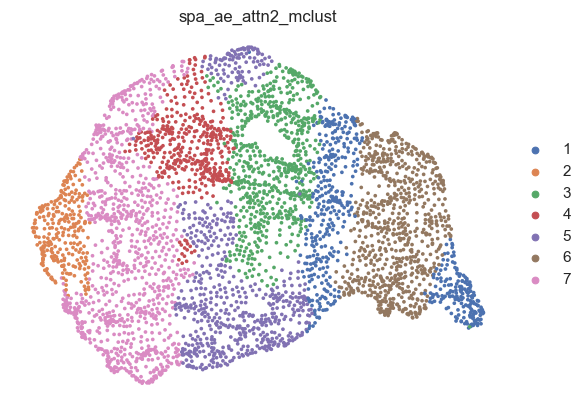

In [27]:
spa_ae = SpaAE(input_dim=3000,
               block_list=["AttnBlock"],
               gat_dim=[512, 32],
               block_out_dims=[32, 32]).to(device)
spa_ae, loss_list = train_loop(loader, spa_ae, n_epochs=n_epochs,
                               gradient_clip=gradient_clip,
                               save_dir=os.path.join(save_dir, "spa_ae_attn2"))
eval_model(spa_ae, data_mask1, adata_mask1, "spa_ae_attn2")

  0%|          | 0/1000 [00:00<?, ?it/s]

fitting ...
  |======================================================================| 100%


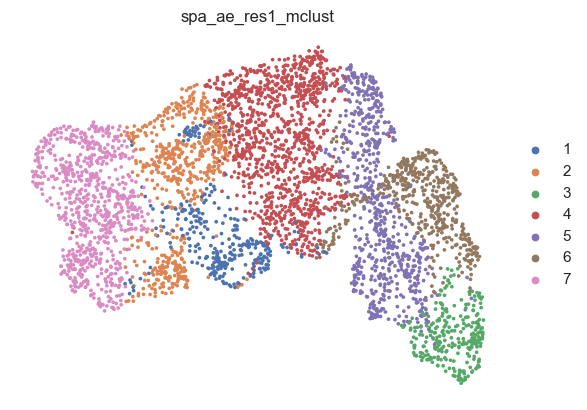

In [25]:
spa_ae = SpaAE(input_dim=3000,
               block_list=["ResBlock"],
               gat_dim=[512],
               block_out_dims=[512, 32]).to(device)
spa_ae, loss_list = train_loop(loader,
                               spa_ae,
                               n_epochs=n_epochs,
                               gradient_clip=gradient_clip,
                               save_dir=os.path.join(save_dir, "spa_ae_res1"))
eval_model(spa_ae, data_mask1, adata_mask1, "spa_ae_res1")

  0%|          | 0/1000 [00:00<?, ?it/s]

fitting ...
  |======================================================================| 100%


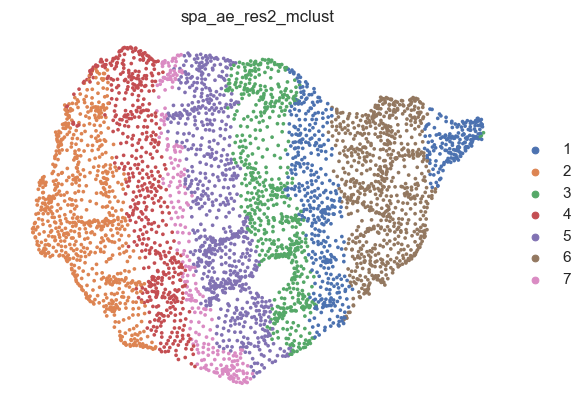

In [26]:
spa_ae = SpaAE(input_dim=3000,
               block_list=["ResBlock"],
               gat_dim=[512, 32],
               block_out_dims=[32, 32]).to(device)
spa_ae, loss_list = train_loop(loader, spa_ae, n_epochs=n_epochs,
                               gradient_clip=gradient_clip, save_dir=os.path.join(save_dir, "spa_ae_res2"))
eval_model(spa_ae, data_mask1, adata_mask1, "spa_ae_res2")

## Use SpaAERes2 as Autoencoder

In [29]:
spa_ae = SpaAE(input_dim=3000,
               block_list=["ResBlock"],
               gat_dim=[512, 32],
               block_out_dims=[32, 32]).to(device)
# E:\Projects\diffusion\output\spa_ae_res2\model.pth
spa_ae.load_state_dict(torch.load("E:\Projects\diffusion\output\spa_ae_res2\model.pth"))
with torch.no_grad():
    z, out = spa_ae(data_mask1.x, data_mask1.edge_index)
adata_mask1.obsm["SpaAERes2"] = z.detach().cpu().numpy()

fitting ...
  |======================================================================| 100%


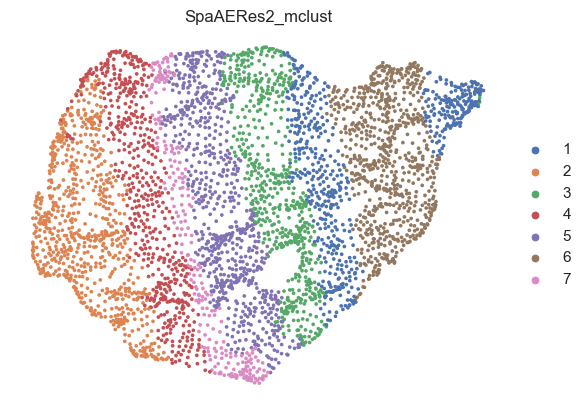

In [30]:
eval_model(spa_ae, data_mask1, adata_mask1, "SpaAERes2")

In [68]:
import numpy as np
# remove cell in adata_mask1.uns["Spatial_Net"] not in adata_mask1 obs.index
masked_spatial_net = adata.uns["Spatial_Net"].copy()
remained_edges = np.logical_and(np.isin(masked_spatial_net.Cell1, adata_mask1.obs.index), np.isin(masked_spatial_net.Cell2, adata_mask1.obs.index))
masked_spatial_net = masked_spatial_net.iloc[remained_edges, :]
adata_mask1.uns["Spatial_Net"] = masked_spatial_net

In [134]:
normalizer = MinMaxNormalize(adata_mask1.obsm["SpaAERes2"], dim=0)
normalized_rep = normalizer.normalize(adata_mask1.obsm["SpaAERes2"])
adata_mask1.obsm["SpaAERes2"] = normalized_rep

### Training denoising model

  0%|          | 0/1000 [00:00<?, ?it/s]

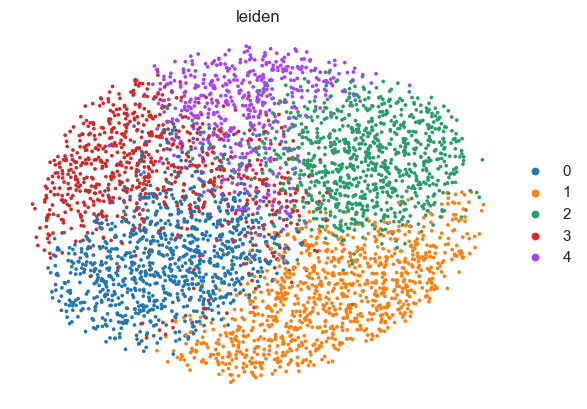

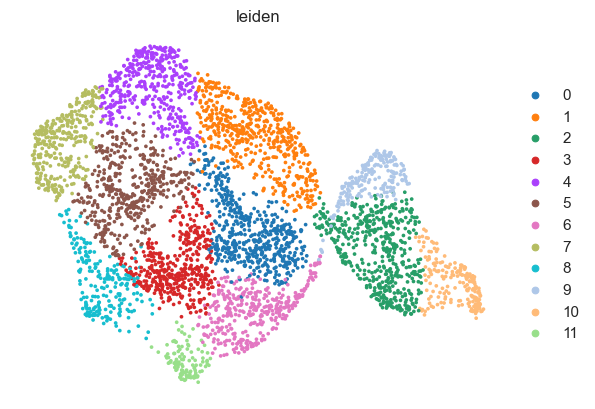

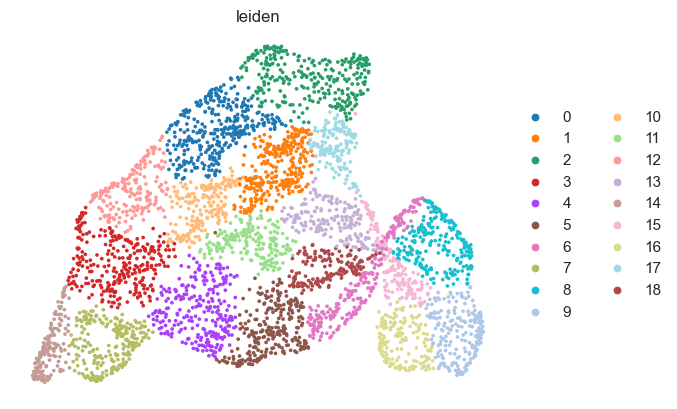

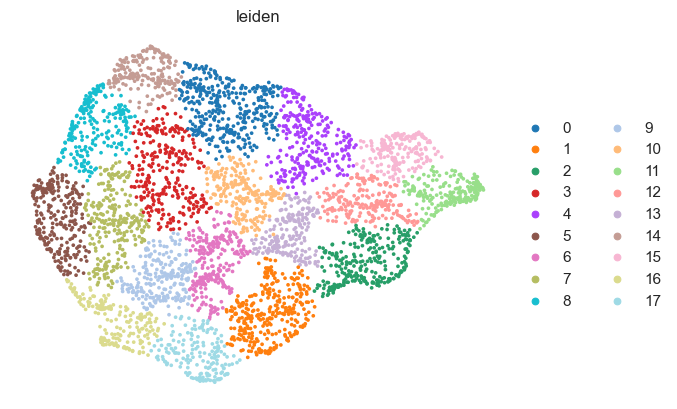

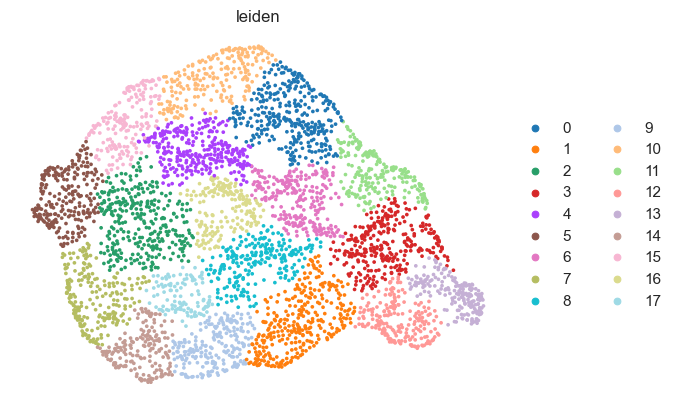

...

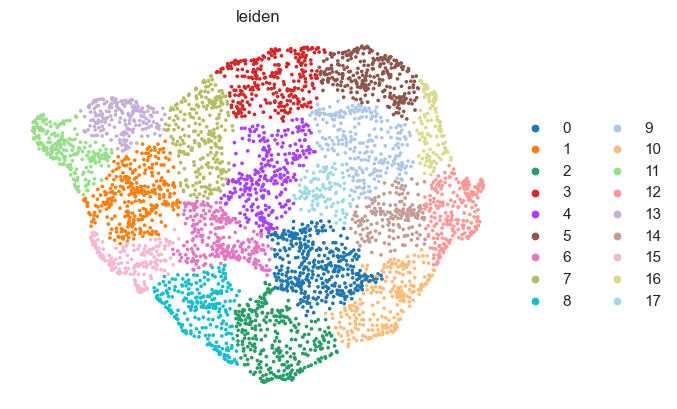

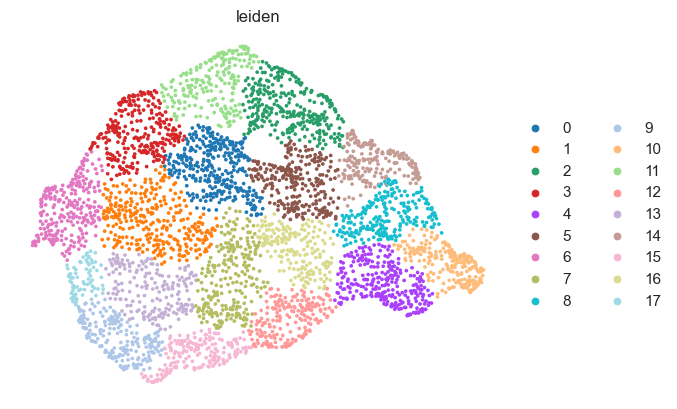

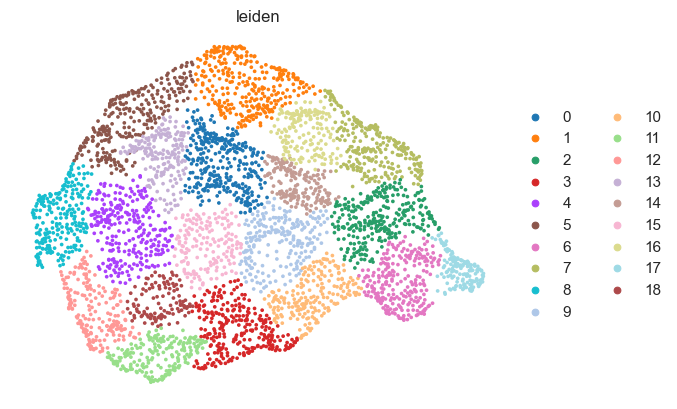

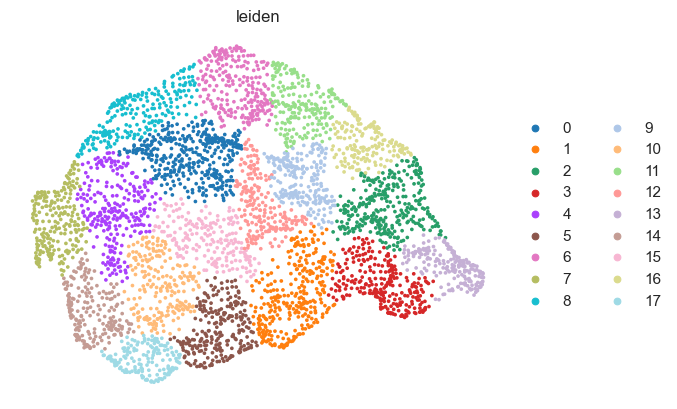

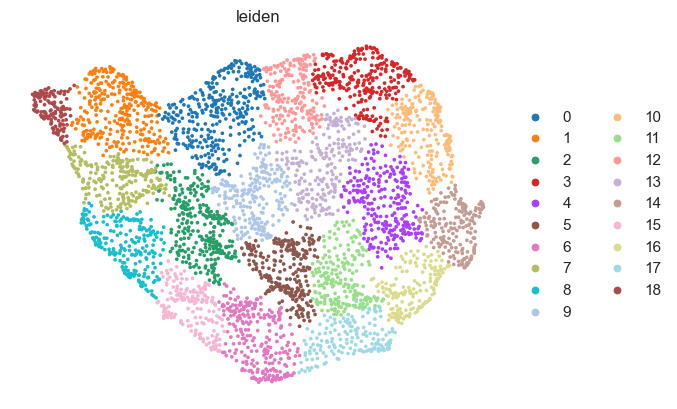

In [140]:
data = prepare_dataset(adata_mask1, used_key="SpaAERes2", used_spatial='spatial').to(device)
denoise_net = SpaUNet1DModel(in_channels=17, out_channels=1, ).to(device)
optimizer = torch.optim.AdamW(denoise_net.parameters(), lr=1e-4, weight_decay=1e-6)
niose_scheduler = DDPMScheduler(num_train_timesteps=1000)
optimizer = torch.optim.AdamW(denoise_net.parameters(), lr=1e-4, weight_decay=1e-6)
lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=n_epochs)
pbar = tqdm(range(n_epochs))
evaluate_interval = 100
logging = defaultdict(list)
loader = NeighborLoader(data, num_neighbors=[5, 3],
                        batch_size=64,)
n_epochs = 1000
for epoch in range(1, n_epochs+1):
    for batch_id, batch in enumerate(loader):
        clean_data = batch.x
        clean_data = clean_data.unsqueeze(1) # (batch_size, 1, num_channels)
        optimizer.zero_grad()
        noise = torch.randn_like(clean_data)
        timesteps = torch.randint(0, 1000, (clean_data.shape[0],), device=data.x.device, dtype=torch.long, )
        noisy_data = niose_scheduler.add_noise(clean_data, noise, timesteps)
        noise_pred = denoise_net(noisy_data, timesteps, batch.spatial).sample
        loss = F.mse_loss(noise_pred, noise)
        loss.backward()
        logging["loss"].append(loss.item())
        # clip gradient
        torch.nn.utils.clip_grad_norm_(denoise_net.parameters(), 5)
        optimizer.step()
        lr_scheduler.step()
        pbar.set_description(f"Epoch: {epoch}, Loss: {loss.item():.4f}, batch_id: {batch_id}")
    pbar.update(1)
    if epoch % evaluate_interval == 0 or epoch == 1:
        evaluate(adata_mask1, data, niose_scheduler, denoise_net,
         save_folder="E:\Projects\diffusion\output\spa_ae_res2\\figures",
         prefix="{}h".format(epoch // 100), cluster_method="leiden", cluster_params=0.8,)
torch.save(denoise_net.state_dict(), "E:\Projects\diffusion\output\spa_ae_res2\denoise_net.pth")

fitting ...
  |======================================================================| 100%


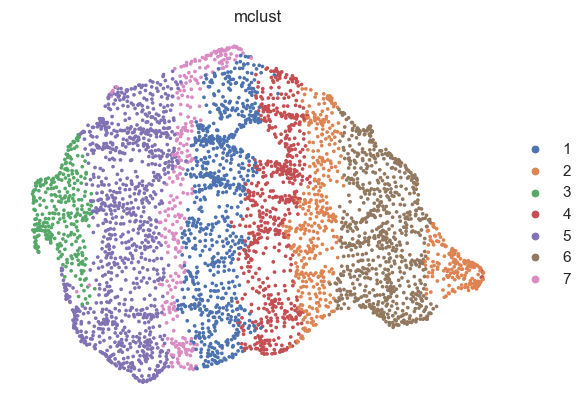

In [141]:
evaluate(adata_mask1, data, niose_scheduler, denoise_net,
 save_folder="E:\Projects\diffusion\output\spa_ae_res2\\figures", cluster_method="mclust", cluster_params=7,
 prefix="final")

### Let's try to recover

In [145]:
full_data = prepare_dataset(adata, used_key="STAGATE", used_spatial='spatial').to(device)

In [146]:
denoised = randn_tensor(full_data.x.shape, device=full_data.x.device)
denoised = denoised.unsqueeze(1)
with torch.no_grad():
    for t in tqdm(niose_scheduler.timesteps):
        model_output = denoise_net(denoised, t, full_data.spatial).sample
        denoised = niose_scheduler.step(model_output, t, denoised).prev_sample
denoised = denoised.squeeze(1)

  0%|          | 0/1000 [00:00<?, ?it/s]

fitting ...
  |======================================================================| 100%


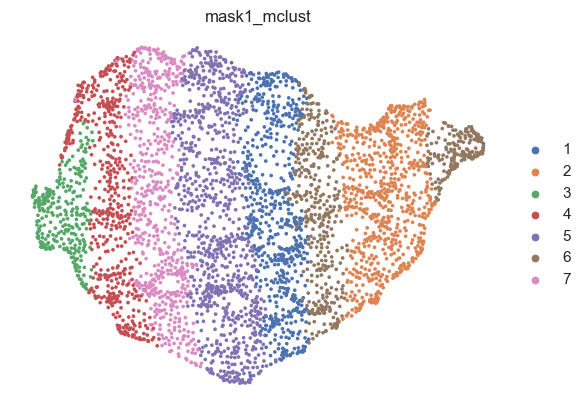

In [147]:
adata.obsm["mask1"] = denoised.cpu().numpy()
# run umap
sc.pp.neighbors(adata, use_rep="mask1", n_neighbors=30)
sc.tl.umap(adata, min_dist=0.5)
# run r_mclust
adata = utils.mclust_R(adata, 7, used_obsm="mask1", add_key="mask1_mclust", random_seed=2023)
sc.pl.umap(adata, color=["mask1_mclust"], ncols=1, frameon=False, wspace=0.4, use_raw=False)

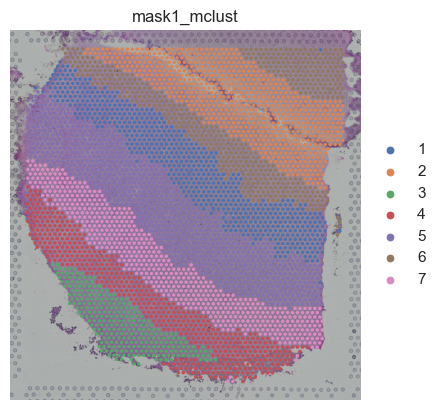

In [148]:
sc.pl.spatial(adata, color=["mask1_mclust"], ncols=1, frameon=False, wspace=0.4, use_raw=False)

In [149]:
adata.shape

(4226, 3000)

In [20]:
from STAGATE_pyG.STAGATE import STAGATE
from STAGATE_pyG.Train_STAGATE import train_STAGATE
autoencoder = STAGATE(hidden_dims=[3000, 512, 32]).to(device)
optimizer = torch.optim.Adam(autoencoder.parameters(), lr=1e-3, weight_decay=1e-6)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=n_epochs)
loss_list = []
n_epochs, gradient_clip = 1000, 5
pbar = tqdm(range(n_epochs))
autoencoder.train()
for epoch in range(1, n_epochs+1):
    for batch in loader:
        optimizer.zero_grad()
        z, out = autoencoder(batch.x, batch.edge_index)
        loss = F.mse_loss(out, batch.x)
        loss_list.append(loss.item())
        loss.backward()
        torch.nn.utils.clip_grad_norm_(autoencoder.parameters(), gradient_clip)
        optimizer.step()
        pbar.set_description(f"Epoch: {epoch}, Loss: {loss.item():.4f}")
        loss_list.append(loss.item())
    scheduler.step()
    pbar.update(1)

  0%|          | 0/1000 [00:00<?, ?it/s]

In [21]:
with torch.no_grad():
    z, out = autoencoder(data_mask1.x, data_mask1.edge_index)
adata_mask1.obsm["STAGATE"] = z.detach().cpu().numpy()
adata_mask1 = utils.mclust_R(adata_mask1, 7, used_obsm="STAGATE", add_key="STAGATE", random_seed=2023)

fitting ...
  |======================================================================| 100%


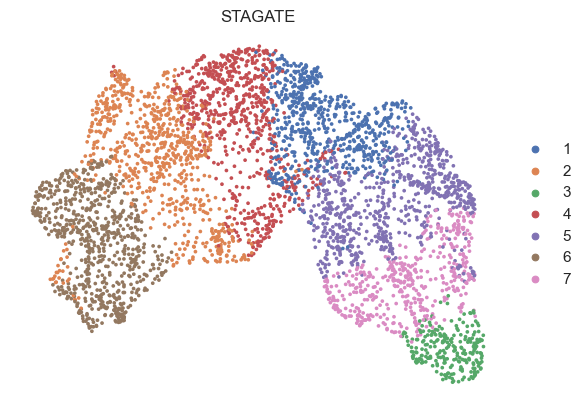

In [22]:
sc.pp.neighbors(adata_mask1, use_rep="STAGATE", n_neighbors=30)
sc.tl.umap(adata_mask1, min_dist=0.5)
sc.pl.umap(adata_mask1, color=["STAGATE"], ncols=1, frameon=False, wspace=0.4, use_raw=False)

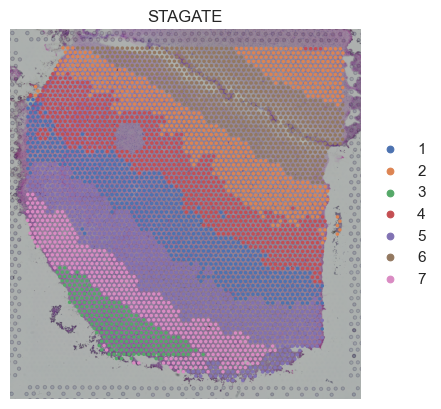

In [23]:
sc.pl.spatial(adata_mask1, color=["STAGATE"], ncols=1, frameon=False, wspace=0.4, use_raw=False)

In [14]:
spa_ae.eval()
with torch.no_grad():
    z, out = spa_ae(data_mask1.x, data_mask1.edge_index)
adata_mask1.obsm["SpaAE"] = z.detach().cpu().numpy()
adata_mask1 = utils.mclust_R(adata_mask1, 7, used_obsm="SpaAE", add_key="SpaAE", random_seed=2023)
sc.pp.neighbors(adata_mask1, use_rep="SpaAE", n_neighbors=30)
sc.tl.umap(adata_mask1, min_dist=0.5)
sc.pl.umap(adata_mask1, color=["SpaAE"], ncols=1, frameon=False, wspace=0.4, use_raw=False)

R[write to console]:     __  ___________    __  _____________
   /  |/  / ____/ /   / / / / ___/_  __/
  / /|_/ / /   / /   / / / /\__ \ / /   
 / /  / / /___/ /___/ /_/ /___/ // /    
/_/  /_/\____/_____/\____//____//_/    version 5.4.9
Type 'citation("mclust")' for citing this R package in publications.



fitting ...
  |======================================================================| 100%


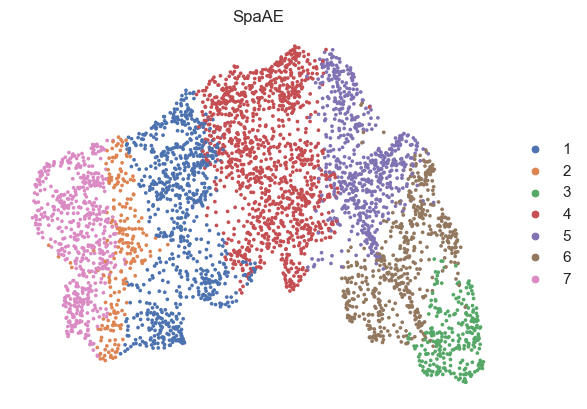

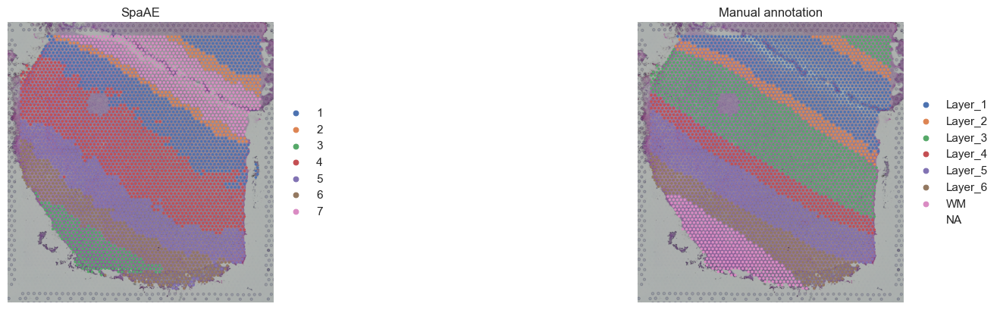

In [16]:
sc.pl.spatial(adata_mask1, color=["SpaAE", "Manual annotation"], ncols=2, frameon=False, wspace=0.4, use_raw=False)

In [17]:
n_epochs, gradient_clip = 1000, 5
spa_ae = SpaAE(input_dim=3000,
               block_list=["ResBlock"],
               gat_dim=512,
               block_out_dims=[512, 32]).to(device)
optimizer = torch.optim.Adam(spa_ae.parameters(), lr=1e-3, weight_decay=1e-6)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=n_epochs)
loss_list = []
pbar = tqdm(range(n_epochs))
spa_ae.train()
for epoch in range(1, n_epochs+1):
    for batch in loader:
        optimizer.zero_grad()
        z, out = spa_ae(batch.x, batch.edge_index)
        loss = F.mse_loss(out, batch.x)
        loss_list.append(loss.item())
        loss.backward()
        torch.nn.utils.clip_grad_norm_(spa_ae.parameters(), gradient_clip)
        optimizer.step()
        pbar.set_description(f"Epoch: {epoch}, Loss: {loss.item():.4f}")
        loss_list.append(loss.item())
    scheduler.step()
    pbar.update(1)
# save model to disk
torch.save(spa_ae.state_dict(), "E:\Projects\diffusion\output\spa_ae_res.pth")

  0%|          | 0/1000 [00:00<?, ?it/s]

In [18]:
from stadiff.vae import SpaVAE
n_epochs, gradient_clip = 1000, 5
spa_vae = SpaVAE(input_dim=3000,
                 block_list=["AttnBlock"],
                 gat_dim=512,
                 hidden_dim=32,
                 block_out_dims=[512, 64]).to(device)

optimizer = torch.optim.Adam(spa_vae.parameters(), lr=1e-3, weight_decay=1e-6)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=n_epochs)
loss_list = []
pbar = tqdm(range(n_epochs))
spa_vae.train()
for epoch in range(1, n_epochs+1):
    for batch in loader:
        optimizer.zero_grad()
        _, recon_features, mu, log_var, z = spa_vae(batch.x, batch.edge_index)
        loss, recon_loss, kld_loss = spa_vae.loss(batch.x, recon_features, mu, log_var)
        loss_list.append(loss.item())
        loss.backward()
        torch.nn.utils.clip_grad_norm_(spa_vae.parameters(), gradient_clip)
        optimizer.step()
        pbar.set_description(f"Epoch: {epoch}, Loss: {loss.item():.4f}")
        loss_list.append(loss.item())
    scheduler.step()
    pbar.update(1)
# save model to disk
torch.save(spa_vae.state_dict(), "E:\Projects\diffusion\output\spa_vae_attn.pth")

  0%|          | 0/1000 [00:00<?, ?it/s]

In [24]:
with torch.no_grad():
    _, recon_features, mu, log_var, z = spa_vae(data_mask1.x, data_mask1.edge_index)
adata_mask1.obsm["SpaVAE"] = mu.detach().cpu().numpy()
adata_mask1 = utils.mclust_R(adata_mask1, 7, used_obsm="SpaVAE", add_key="SpaVAE", random_seed=2023)

fitting ...
  |======================================================================| 100%


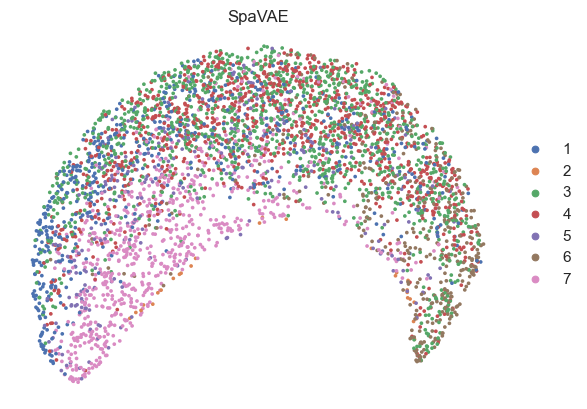

In [25]:
sc.pp.neighbors(adata_mask1, use_rep="SpaVAE", n_neighbors=30)
sc.tl.umap(adata_mask1, min_dist=0.5)
sc.pl.umap(adata_mask1, color=["SpaVAE"], ncols=1, frameon=False, wspace=0.4, use_raw=False)

In [26]:
spa_ae.eval()
with torch.no_grad():
    z, out = spa_ae(data_mask1.x, data_mask1.edge_index)
adata_mask1.obsm["SpaAE"] = z.detach().cpu().numpy()
adata_mask1 = utils.mclust_R(adata_mask1, 7, used_obsm="SpaAE", add_key="SpaAE", random_seed=2023)

fitting ...
  |======================================================================| 100%


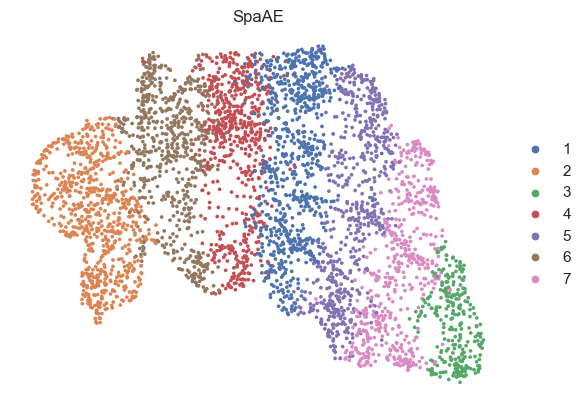

In [27]:
sc.pp.neighbors(adata_mask1, use_rep="SpaAE", n_neighbors=30)
sc.tl.umap(adata_mask1, min_dist=0.5)
sc.pl.umap(adata_mask1, color=["SpaAE"], ncols=1, frameon=False, wspace=0.4, use_raw=False)

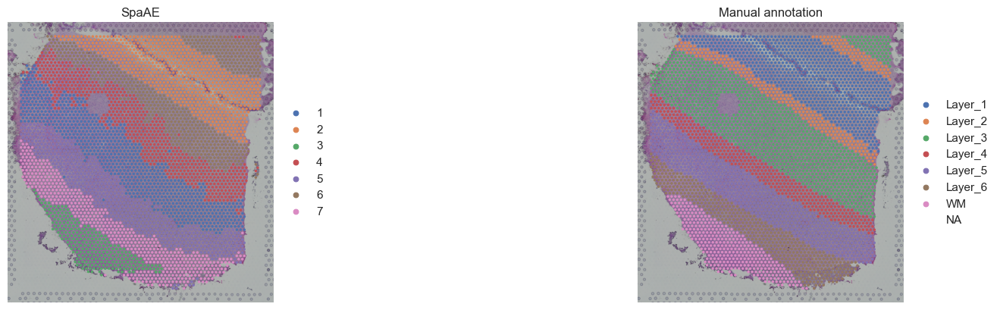

In [21]:
sc.pl.spatial(adata_mask1, color=["SpaAE", "Manual annotation"], ncols=2, frameon=False, wspace=0.4, use_raw=False)

In [9]:
autoencoder = STAGATE(hidden_dims=[3000, 512, 32]).to(device)
n_epochs, gradient_clip = 1000, 5
optimizer = torch.optim.Adam(autoencoder.parameters(), lr=1e-3, weight_decay=1e-6)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=n_epochs)
loss_list = []
autoencoder.train()
pbar = tqdm(range(n_epochs))
for epoch in range(1, n_epochs+1):
    optimizer.zero_grad()
    z, out = autoencoder(data_mask1.x, data_mask1.edge_index)
    loss = F.mse_loss(out, data_mask1.x)
    loss_list.append(loss.item())
    loss.backward()
    torch.nn.utils.clip_grad_norm_(autoencoder.parameters(), gradient_clip)
    optimizer.step()
    pbar.set_description(f"Epoch: {epoch}, Loss: {loss.item():.4f}")
    loss_list.append(loss.item())
    scheduler.step()
    pbar.update(1)
adata_mask1.obsm["STAGATE"] = z.detach().cpu().numpy()

  0%|          | 0/1000 [00:00<?, ?it/s]

In [10]:
# run mclust
adata_mask1 = utils.mclust_R(adata_mask1, 7, used_obsm="STAGATE", add_key="STAGATE", random_seed=2023)

R[write to console]:     __  ___________    __  _____________
   /  |/  / ____/ /   / / / / ___/_  __/
  / /|_/ / /   / /   / / / /\__ \ / /   
 / /  / / /___/ /___/ /_/ /___/ // /    
/_/  /_/\____/_____/\____//____//_/    version 5.4.9
Type 'citation("mclust")' for citing this R package in publications.



fitting ...
  |======================================================================| 100%


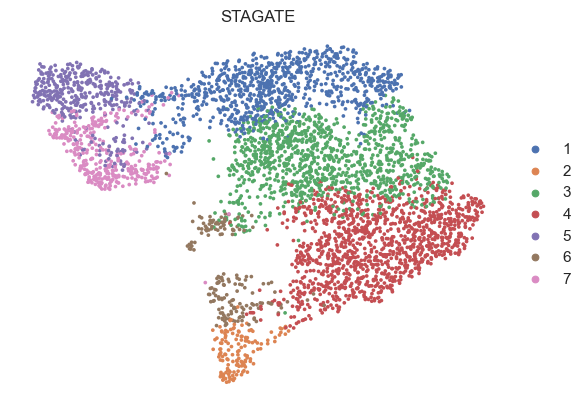

In [11]:
# umap use STAGATE
sc.pp.neighbors(adata_mask1, use_rep="STAGATE", n_neighbors=30)
sc.tl.umap(adata_mask1, min_dist=0.5)
sc.pl.umap(adata_mask1, color=["STAGATE"], ncols=1, frameon=False, wspace=0.4, use_raw=False)

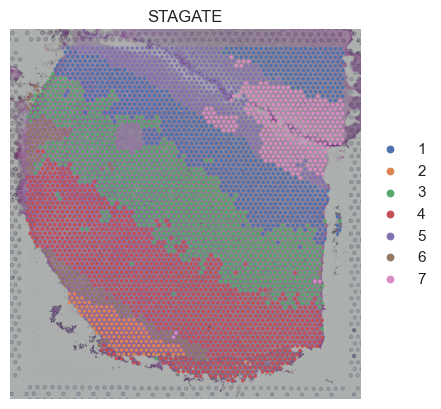

In [12]:
sc.pl.spatial(adata_mask1, color=["STAGATE"], ncols=1, frameon=False, wspace=0.4, use_raw=False)

In [2]:
adata = sc.read_h5ad("E:\Projects\diffusion\STAGATE.h5ad")
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
min_val = adata.obsm["STAGATE"].min()
max_val = adata.obsm["STAGATE"].max()
adata.obsm["STAGATE"] = (adata.obsm["STAGATE"] - min_val) / (max_val - min_val) * 2 - 1
niose_scheduler = DDPMScheduler(num_train_timesteps=1000)
n_epochs = 1000
evaluate_interval = 100
adata.obsm
data = prepare_dataset(adata, used_key="STAGATE", used_spatial='spatial').to(device)

In [3]:
denoised = randn_tensor(data.x.shape, device=data.x.device)
denoised = denoised.unsqueeze(1)

torch.Size([4226, 1, 32])

In [3]:
data = Transfer_pytorch_Data(adata, used_key="STAGATE").to(device)
denoise_net = UNet1DModel(in_channels=17, out_channels=1, ).to(device)
optimizer = torch.optim.AdamW(denoise_net.parameters(), lr=1e-4, weight_decay=1e-6)
lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=n_epochs)
pbar = tqdm(range(n_epochs))
logging = defaultdict(list)
loader = NeighborLoader(data, num_neighbors=[6] * 2,
                        batch_size=64,)
for epoch in range(1, n_epochs+1):
    for batch_id, batch in enumerate(loader):
        clean_data = batch.x
        clean_data = clean_data.unsqueeze(1) # (batch_size, 1, num_channels)
        optimizer.zero_grad()
        noise = torch.randn_like(clean_data)
        timesteps = torch.randint(0, 1000, (clean_data.shape[0],), device=data.x.device, dtype=torch.long, )
        noisy_data = niose_scheduler.add_noise(clean_data, noise, timesteps)
        noise_pred = denoise_net(noisy_data, timesteps).sample
        loss = F.mse_loss(noise_pred, noise)
        loss.backward()
        logging["loss"].append(loss.item())
        # clip gradient
        torch.nn.utils.clip_grad_norm_(denoise_net.parameters(), 5)
        optimizer.step()
        lr_scheduler.step()
        pbar.set_description(f"Epoch: {epoch}, Loss: {loss.item():.4f}, batch_id: {batch_id}")
    pbar.update(1)
    if epoch % evaluate_interval == 0 or epoch == 1:
        evaluate(adata, data, niose_scheduler, denoise_net, prefix="{}h".format(epoch // 100))
torch.save(denoise_net.state_dict(), "E:\Projects\diffusion\output\STAGATE_unet1d.pth")

  0%|          | 0/1000 [00:00<?, ?it/s]

In [4]:
data = prepare_dataset(adata, used_key="STAGATE", used_spatial='spatial').to(device)

NameError: name 'adata' is not defined

In [4]:
data = prepare_dataset(adata, used_key="STAGATE", used_spatial='spatial').to(device)
denoise_net = SpaUNet1DModel(in_channels=17, out_channels=1, ).to(device)
optimizer = torch.optim.AdamW(denoise_net.parameters(), lr=1e-4, weight_decay=1e-6)
niose_scheduler = DDPMScheduler(num_train_timesteps=1000)
optimizer = torch.optim.AdamW(denoise_net.parameters(), lr=1e-4, weight_decay=1e-6)
lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=n_epochs)
pbar = tqdm(range(n_epochs))
logging = defaultdict(list)
loader = NeighborLoader(data, num_neighbors=[6] * 2,
                        batch_size=64,)
for epoch in range(1, n_epochs+1):
    for batch_id, batch in enumerate(loader):
        clean_data = batch.x
        clean_data = clean_data.unsqueeze(1) # (batch_size, 1, num_channels)
        optimizer.zero_grad()
        noise = torch.randn_like(clean_data)
        timesteps = torch.randint(0, 1000, (clean_data.shape[0],), device=data.x.device, dtype=torch.long, )
        noisy_data = niose_scheduler.add_noise(clean_data, noise, timesteps)
        noise_pred = denoise_net(noisy_data, timesteps, batch.spatial).sample
        loss = F.mse_loss(noise_pred, noise)
        loss.backward()
        logging["loss"].append(loss.item())
        # clip gradient
        torch.nn.utils.clip_grad_norm_(denoise_net.parameters(), 5)
        optimizer.step()
        lr_scheduler.step()
        pbar.set_description(f"Epoch: {epoch}, Loss: {loss.item():.4f}, batch_id: {batch_id}")
    pbar.update(1)
    if epoch % evaluate_interval == 0 or epoch == 1:
        evaluate(adata, data, niose_scheduler, denoise_net, prefix="{}_spa_h".format(epoch // 100))
torch.save(denoise_net.state_dict(), "E:\Projects\diffusion\output\STAGATE_spa_unet1d.pth")

  0%|          | 0/1000 [00:00<?, ?it/s]

AnnData object with n_obs × n_vars = 4226 × 3000
    obs: 'in_tissue', 'array_row', 'array_col', 'Manual annotation', 'n_genes', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'Manual annotation_colors', 'Spatial_Net', 'hvg', 'log1p', 'neighbors', 'padding_info', 'spatial', 'umap', 'leiden', 'leiden_colors'
    obsm: 'STAGATE', 'X_umap', 'spatial', 'spatial_ind', 'STAGATE_denoised'
    obsp: 'connectivities', 'distances'

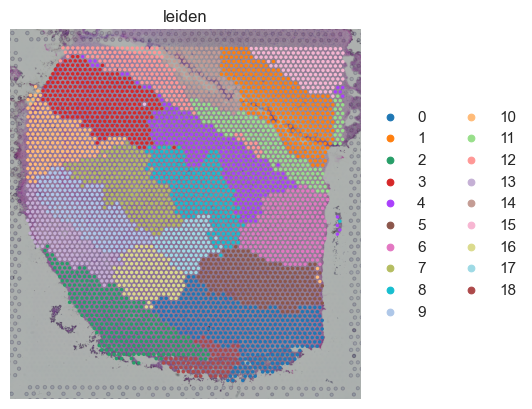

In [6]:
sc.pl.spatial(adata, color=["leiden"], ncols=1, frameon=False, wspace=0.4, use_raw=False)

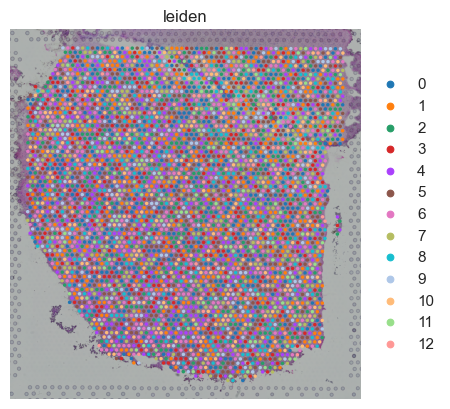

In [18]:
unet1d_state = torch.load("./output/STAGATE_unet1d.pth")
unet1d = UNet1DModel(in_channels=17, out_channels=1, ).to(device)
unet1d.load_state_dict(unet1d_state)
adata_unet1d = sc.read_h5ad("E:\Projects\diffusion\STAGATE.h5ad")
evaluate(adata_unet1d, data, niose_scheduler, unet1d, prefix="final".format(epoch // 100))
sc.pl.spatial(adata_unet1d, color=["leiden"], ncols=1, frameon=False, wspace=0.4, use_raw=False)

In [4]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
spunet1d_state = torch.load("./output/STAGATE_spa_unet1d.pth")
spunet1d = SpaUNet1DModel(in_channels=17, out_channels=1, ).to(device)
spunet1d.load_state_dict(spunet1d_state)
adata_spunet1d = sc.read_h5ad("E:\Projects\diffusion\STAGATE.h5ad")

In [51]:
def simulate(data,
             noise_scheduler,
             model: torch.nn.Module,
             seed=None,
             progress=False,
             n_samples: int = 1,
             return_tuple=True,
             device="cpu",
             **kwargs):
    """
    Simulate the diffusion process of the model.
    :param data: pytorch_geometric dataset
    :param noise_scheduler: the noise scheduler
    :param model: the denoising model
    :param seed: random seed to control torch and numpy
    :param progress: whether to show the progress bar
    :param n_samples: number of samples to simulate
    :param return_tuple: whether to return a tuple of tensors or a single tensor
    :param kwargs: other parameters for the model
    """
    if seed is not None:
        torch.manual_seed(seed)
        np.random.seed(seed)
    n_spots, p = data.x.shape
    denoised = torch.randn((n_spots * n_samples, p), device=data.x.device)
    denoised = denoised.unsqueeze(1)
    # check if spatial_coord in kwargs
    if "spatial_coord" in kwargs:
        has_spatial = True
    if n_samples > 1 and has_spatial:
            spatial_coord = kwargs["spatial_coord"]
            spatial_coord = spatial_coord.repeat(n_samples, 1)
            kwargs["spatial_coord"] = spatial_coord
    with torch.no_grad():
        if progress:
            iterator = tqdm(noise_scheduler.timesteps)
        else:
            iterator = noise_scheduler.timesteps
        for t in iterator:
            model_output = model(denoised, t, **kwargs).sample
            denoised = noise_scheduler.step(model_output, t, denoised).prev_sample
    denoised = torch.squeeze(denoised, 1)
    if device == "cpu":
        denoised = denoised.cpu()
    if n_samples > 1:
        denoised = torch.chunk(denoised, n_samples, dim=0)
        if not return_tuple:
            denoised = torch.cat(denoised, dim=1)
    return denoised

In [52]:
simulated_data = simulate(data, niose_scheduler, spunet1d, n_samples=5,
                          progress=True, spatial_coord=data.spatial)

dict_keys(['spatial_coord'])


  0%|          | 0/1000 [00:00<?, ?it/s]

fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%
fitting ...
  |======================================================================| 100%


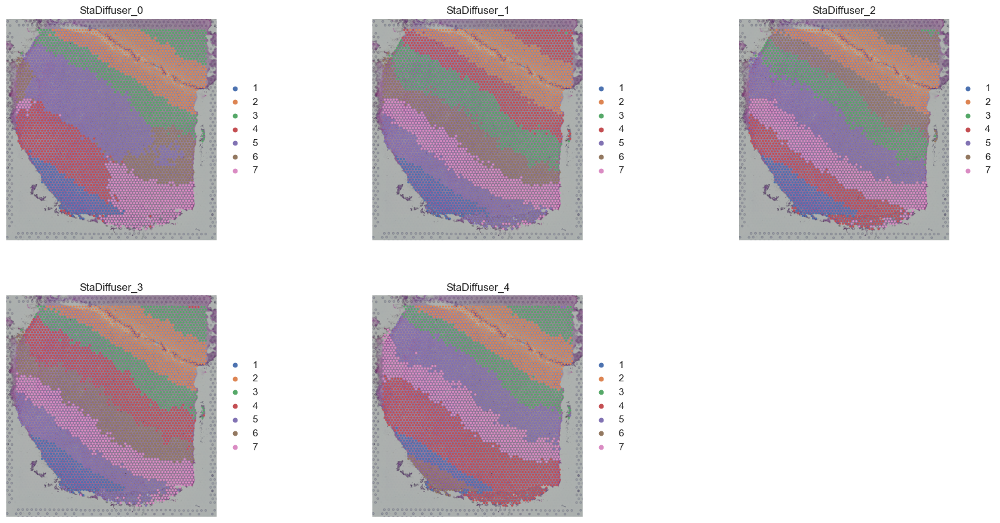

In [53]:
for i in range(5):
    adata_spunet1d.obsm[f"StaDiffuser_{i}"] = simulated_data[i].numpy()
    mclust_R(adata_spunet1d, 7, used_obsm=f"StaDiffuser_{i}", add_key=f"StaDiffuser_{i}")


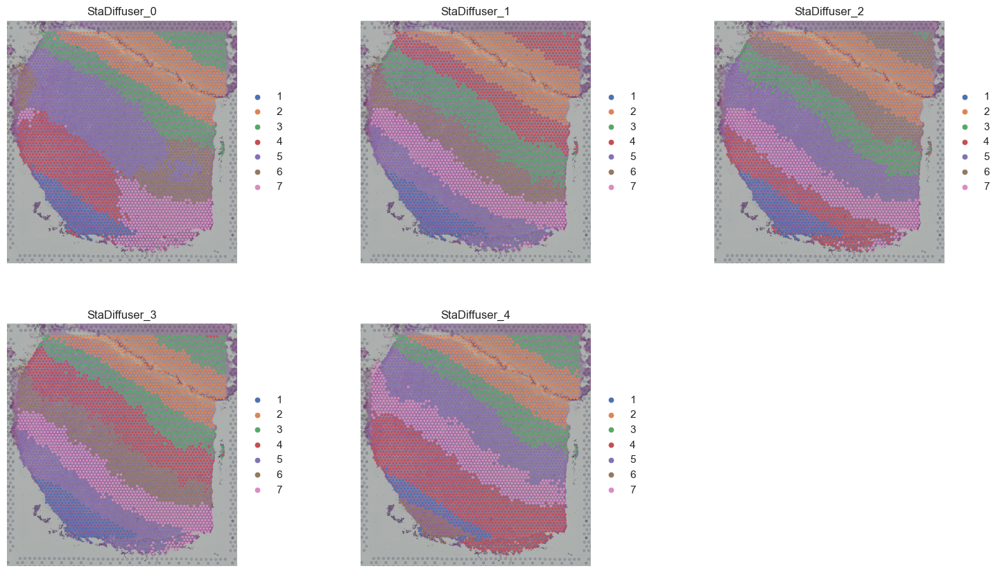

In [77]:
sc.pl.spatial(adata_spunet1d,
              color=["StaDiffuser_0", "StaDiffuser_1", "StaDiffuser_2", "StaDiffuser_3", "StaDiffuser_4"],
              ncols=3, frameon=False, wspace=0, use_raw=False)

In [2]:
evaluate(adata_spunet1d, data, niose_scheduler, spunet1d, prefix="spa_final", resolution=0.4)

In [15]:
adata_circle.obs["circle_mask"].sum(), adata_circle.obs["rect_mask"].sum()

(48, 100)

In [9]:
import scanpy as sc
from stadiff.utils import mask_region
from stadiff.pipeline import prepare_dataset
import numpy as np
adata = sc.read_h5ad("E:\Projects\diffusion\STAGATE.h5ad")
adata_circle = mask_region(adata, "circle", center=[5000, 5000], radius=500, add_key="circle_mask")
adata_circle = mask_region(adata_circle, "rectangle", left_bottom=[6500, 2500], right_top=[7000, 5400], add_key="rect_mask")
adata_circle.obs["mask"] = np.logical_or(adata_circle.obs["circle_mask"], adata_circle.obs["rect_mask"])

In [3]:
masked_data = prepare_dataset(adata_circle, used_key="STAGATE", used_spatial='spatial',
                                 used_mask="mask")

The number of spots after masking:  4078


In [10]:
adata_circle.obs["mask"] = adata_circle.obs["mask"].astype("str")

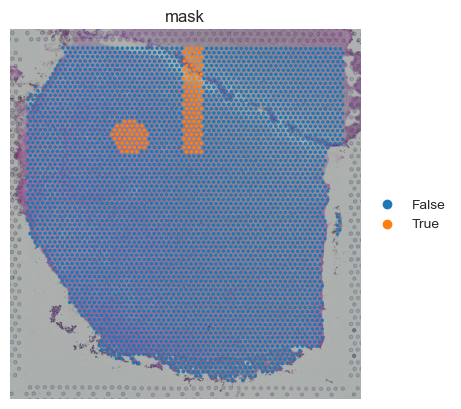

In [11]:
sc.pl.spatial(adata_circle, color=["mask"], ncols=1, frameon=False, wspace=0.4, use_raw=False)

In [3]:
adata_spunet1d = mclust_R(adata_spunet1d, 7, used_obsm="STAGATE_denoised", add_key="STADiff")

In [4]:
adata_spunet1d = mclust_R(adata_spunet1d, 7, used_obsm="STAGATE", add_key="STAGATE")

R[write to console]:     __  ___________    __  _____________
   /  |/  / ____/ /   / / / / ___/_  __/
  / /|_/ / /   / /   / / / /\__ \ / /   
 / /  / / /___/ /___/ /_/ /___/ // /    
/_/  /_/\____/_____/\____//____//_/    version 5.4.9
Type 'citation("mclust")' for citing this R package in publications.



fitting ...
  |======================================================================| 100%


In [5]:
sc.pl.spatial(adata_spunet1d, color=["STADiff", "STAGATE", "Manual annotation"],
              ncols=3, frameon=False, wspace=0.1, use_raw=False)

fitting ...
  |======================================================================| 100%


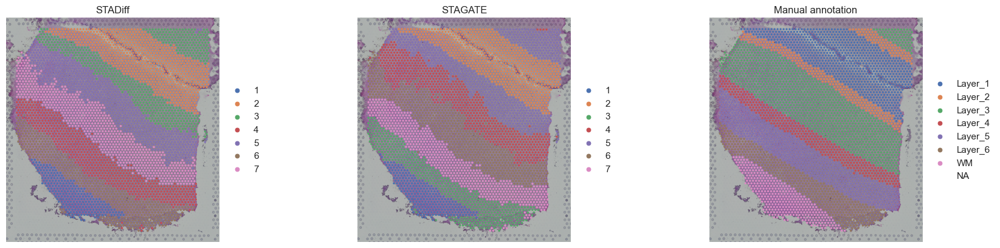

In [6]:
import numpy as np
import pandas as pd
from scanpy import AnnData
normalized_stagate = adata.obsm["STAGATE"]
X = np.concatenate([normalized_stagate, adata_spunet1d.obsm["STAGATE_denoised"]], axis=0)
# adata_comparison = AnnData(X=adata_spunet1d.obsm["STAGATE_denoised"], obs=adata_spunet1d.obs)
labels = ["STAGATE"] * adata_spunet1d.obsm["STAGATE"].shape[0] + ["STADiff"] * adata_spunet1d.obsm["STAGATE_denoised"].shape[0]
adata_comparison = AnnData(X=X, obs=pd.DataFrame({"labels": labels}))
# plot umap
sc.pp.neighbors(adata_comparison, use_rep="X", n_neighbors=30)
sc.tl.umap(adata_comparison, min_dist=0.5)
sc.pl.umap(adata_comparison, color=["labels"], ncols=1, frameon=False, wspace=0.4, use_raw=False)

In [74]:
from scanpy import AnnData
import pandas as pd
mixed_X = np.concatenate([adata_spunet1d.obsm["STAGATE_denoised_0"], adata.obsm["STAGATE"]])
obs_df = pd.DataFrame({"labels": ["STADiffuser"] * adata_spunet1d.obsm["STAGATE_denoised_0"].shape[0] + ["Ground truth"] * adata.obsm["STAGATE"].shape[0]})
adata_mixed = AnnData(X=mixed_X, obs=obs_df)

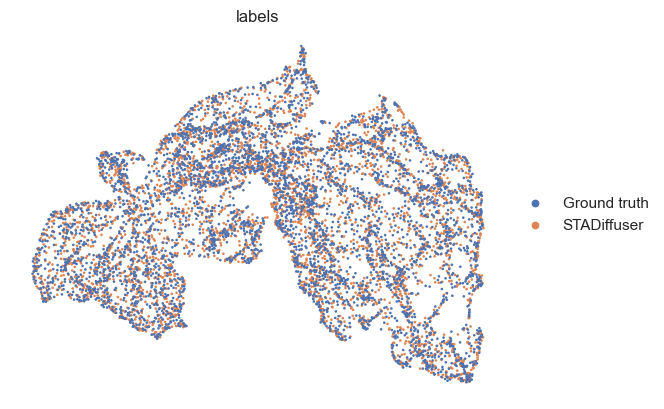

In [75]:
# perform UMAP
sc.pp.neighbors(adata_mixed, use_rep="X", n_neighbors=30)
sc.tl.umap(adata_mixed, min_dist=0.5)
sc.pl.umap(adata_mixed, color=["labels"], ncols=1, frameon=False, wspace=0.4, use_raw=False)